In [1]:
                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                      # Estos dos comandos evitan que haya que hacer reload cada vez que se modifica un paquete%load_ext autoreload
%autoreload 2
%config InlineBackend.figure_format = 'retina'
%matplotlib inline
from IPython.display import HTML
import reg_helper as RHelper

Using TensorFlow backend.


In [2]:
import numpy as np
X_train = np.load('X_train.npy')
X_test = np.load('X_test.npy')
y_train = np.load('y_train.npy') 
y_test = np.load('y_test.npy')

In [3]:
X_train.shape

(59, 2)

In [4]:
y_train

array([0., 1., 1., 1., 0., 1., 1., 1., 1., 0., 0., 1., 1., 0., 1., 0., 1.,
       0., 1., 0., 1., 0., 1., 0., 1., 1., 0., 0., 1., 0., 1., 0., 0., 0.,
       0., 0., 1., 1., 1., 1., 0., 1., 1., 1., 1., 1., 0., 0., 1., 1., 0.,
       0., 1., 0., 1., 0., 1., 0., 1.])

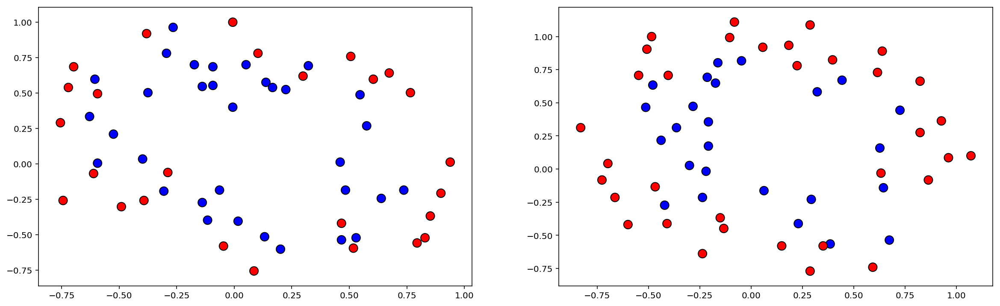

In [5]:
import numpy as np
import draw_nn
from matplotlib import pyplot as plt 
X_train = np.load('X_train.npy')
X_test = np.load('X_test.npy')
y_train = np.load('y_train.npy') 
y_test = np.load('y_test.npy')

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,6))
RHelper.plot_boundaries(X_train, y_train, ax=ax1)
RHelper.plot_boundaries(X_test, y_test, ax=ax2)
plt.show()

## SVM (Clasificadores de máximo margen)

Dado un conjunto de ejemplos de entrenamiento (de muestras) podemos etiquetar las clases y entrenar una SVM para construir un modelo que prediga la clase de una nueva muestra. Intuitivamente, una SVM es un modelo que representa a los puntos de muestra en el espacio, separando las clases a 2 espacios lo más amplios posibles mediante un hiperplano de separación definido como el vector entre los 2 puntos, de las 2 clases, más cercanos al que se llama vector soporte. Cuando las nuevas muestras se ponen en correspondencia con dicho modelo, en función de los espacios a los que pertenezcan, pueden ser clasificadas a una o la otra clase.

Más formalmente, una SVM construye un hiperplano o conjunto de hiperplanos en un espacio de dimensionalidad muy alta (o incluso infinita) que puede ser utilizado en problemas de clasificación o regresión. Una buena separación entre las clases permitirá una clasificación correcta.

Support vector machines (SVMs) are a set of supervised learning methods used for classification, regression and outliers detection.

The advantages of support vector machines are:

Effective in high dimensional spaces.
Still effective in cases where number of dimensions is greater than the number of samples.
Uses a subset of training points in the decision function (called support vectors), so it is also memory efficient.
Versatile: different Kernel functions can be specified for the decision function. Common kernels are provided, but it is also possible to specify custom kernels.
The disadvantages of support vector machines include:

If the number of features is much greater than the number of samples, avoid over-fitting in choosing Kernel functions and regularization term is crucial.
SVMs do not directly provide probability estimates, these are calculated using an expensive five-fold cross-validation (see Scores and probabilities, below).

Multi-class classification
SVC and NuSVC implement the “one-against-one” approach (Knerr et al., 1990) for multi- class classification. If n_class is the number of classes, then n_class * (n_class - 1) / 2 classifiers are constructed and each one trains data from two classes. To provide a consistent interface with other classifiers, the decision_function_shape option allows to aggregate the results of the “one-against-one” classifiers to a decision function of shape (n_samples, n_classes):

SVMs decision function depends on some subset of the training data, called the support vectors. Some properties of these support vectors can be found in members support_vectors_, support_ and n_support:

http://scikit-learn.org/stable/modules/generated/sklearn.svm.SVC.html
http://scikit-learn.org/stable/modules/svm.html

## Kernels

$${\hat {y}}=\operatorname {sgn} (\sum _{i=1}^{n}w_{i}y_{i}k(\mathbf {x} _{i},\mathbf {x'}) )$$

where

- $ {\hat {y}}\in \{-1,+1\}$ is the kernelized binary classifier's predicted label for the unlabeled input $ \mathbf {x'}$ whose hidden true label $y $is of interest;  
- $ k\colon {\mathcal {X}}\times {\mathcal {X}}\to \mathbb {R}$  is the kernel function that measures similarity between any pair of inputs $ \mathbf {x} ,\mathbf {x'} \in {\mathcal {X}}$;  
- the sum ranges over the $n$ labeled examples $\{(\mathbf {x} _{i},y_{i})\}_{i=1}^{n}$ in the classifier's training set, with $y_{i}\in \{-1,+1\}$;  
- the $ w_{i}\in \mathbb {R} $ are the weights for the training examples, as determined by the learning algorithm;  
- the sign function $\operatorname {sgn}$  determines whether the predicted classification ${\hat {y}}$ comes out positive or negative.  

### Linear Kernel

$k=\langle x, x'\rangle$

C = 10^6


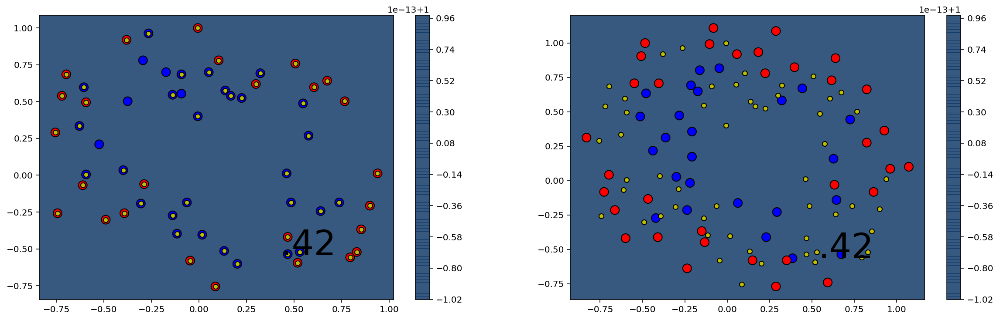

C = 10^7


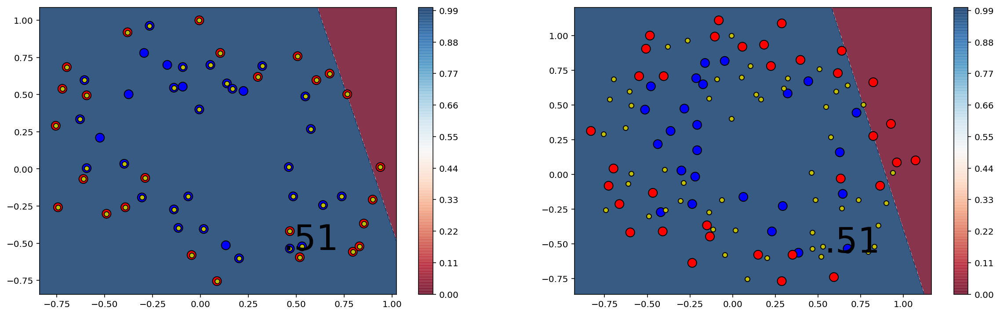

C = 10^8


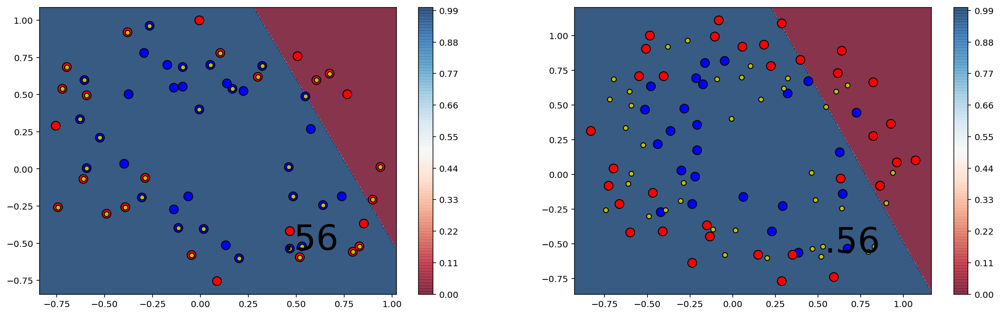

C = 10^9


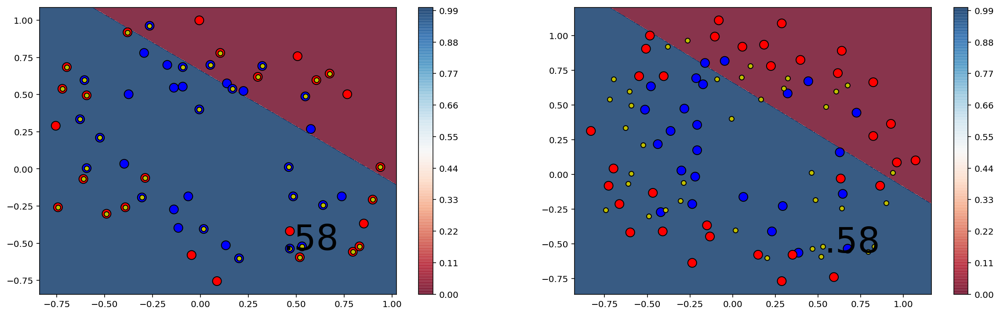

C = 10^10


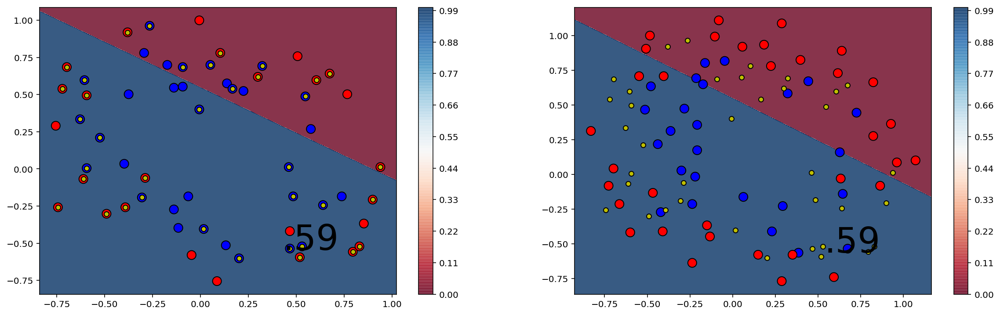

In [40]:
from sklearn.svm import SVC
for mod_n,C in enumerate(range(6,11)):
    print("C = 10^{}".format(C))
    model=SVC(kernel='linear',C=10**C,tol=1e-3) #a safe choice of C is 10^-5 ... 10^5, going up in exponential steps.
    model.fit(X_train,y_train)
    score=model.score(X_test,y_test)
    score
    def pred_class(X_test):
        out=list()
        a= model.decision_function(X_test)
        out= [[i<0,i>=0] for i in a]
        return np.array(out)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,6))
    RHelper.plot_boundaries_SVM(X_train, y_train, score,support_vectors=model.support_vectors_,class_func=pred_class, ax=ax1)
    RHelper.plot_boundaries_SVM(X_test, y_test, score,support_vectors=model.support_vectors_,class_func=pred_class, ax=ax2)
    plt.show()

C = 10^-6
La cantidad de vectores de soporte es 4134


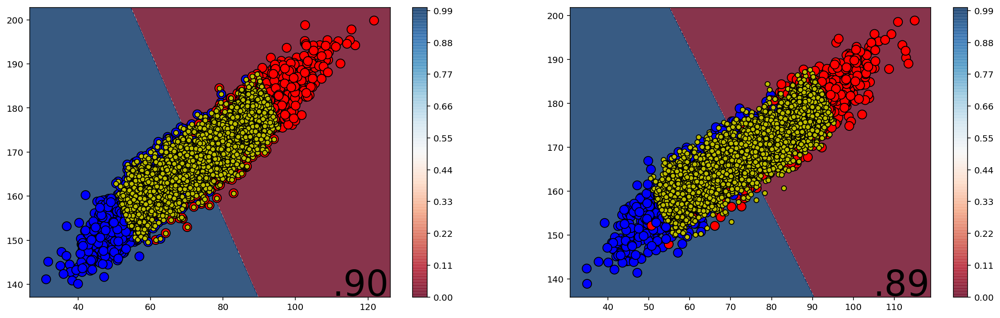

C = 10^-5
La cantidad de vectores de soporte es 2182


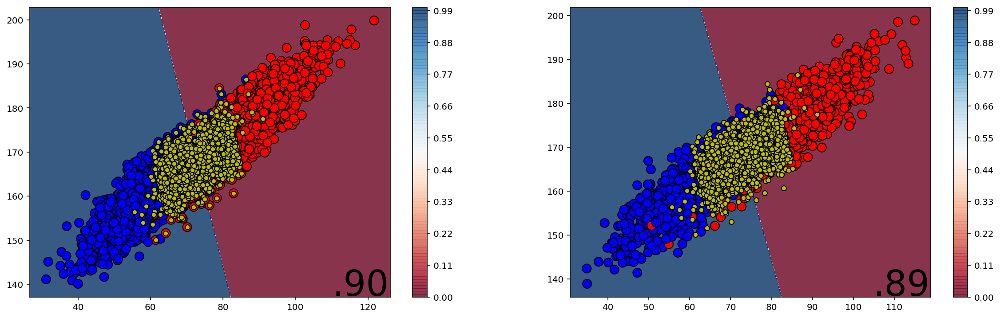

C = 10^-4
La cantidad de vectores de soporte es 1404


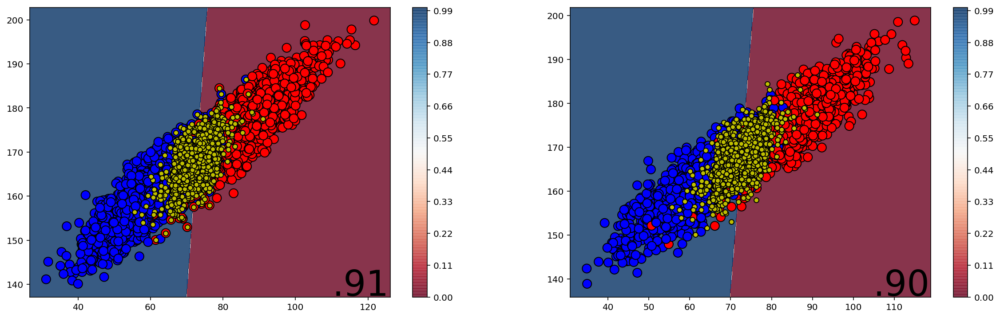

C = 10^-3
La cantidad de vectores de soporte es 1132


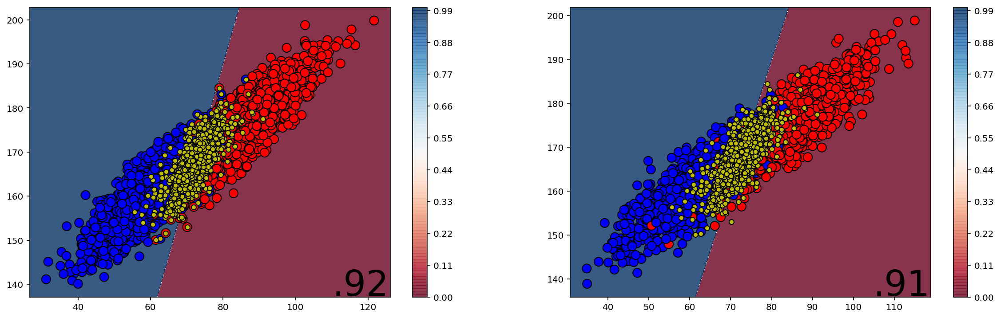

C = 10^-2
La cantidad de vectores de soporte es 1070


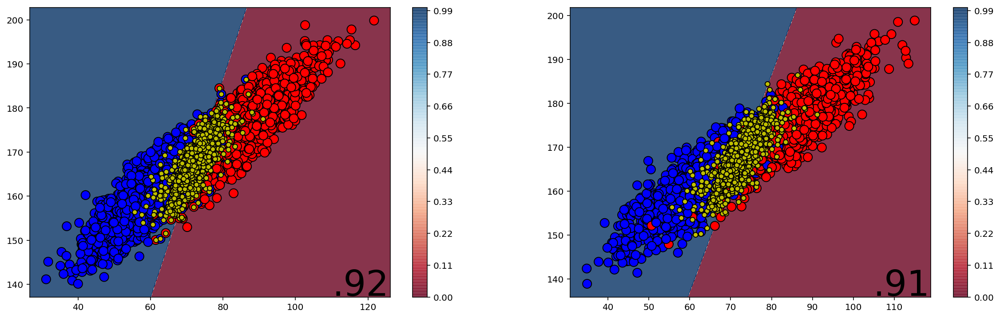

C = 10^-1
La cantidad de vectores de soporte es 1062


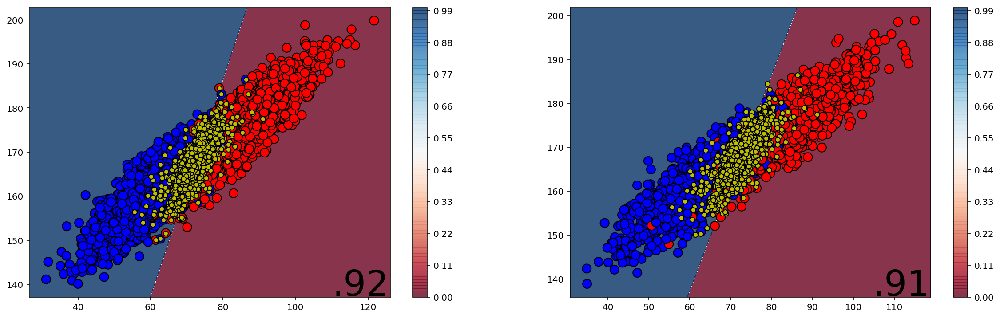

In [56]:
X2_train=data[['Peso', 'Altura']].values[:5000,:]
X2_test=data[['Peso', 'Altura']].values[5000:,:]
y2_train=data['Genero'].values[:5000]=="Mujer"
y2_test=data['Genero'].values[5000:]=="Mujer"
for mod_n,C in enumerate(range(-6,0)):
    print("C = 10^{}".format(C))
    model2=SVC(kernel='linear',C=10**C,tol=1e-6)
    model2.fit(X2_train,y2_train)
    score_train=model2.score(X2_train,y2_train)
    score_test=model2.score(X2_test,y2_test)
    print("La cantidad de vectores de soporte es {}".format(model2.support_vectors_.shape[0]))
    def pred_class(X_test):
        out=list()
        a= model2.decision_function(X_test)
        out= [[i<0,i>=0] for i in a]
        return np.array(out)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,6))
    RHelper.plot_boundaries_SVM(X2_train,y2_train, score_train,support_vectors=model2.support_vectors_,class_func=pred_class, ax=ax1)
    RHelper.plot_boundaries_SVM(X2_test,y2_test, score_test,support_vectors=model2.support_vectors_,class_func=pred_class, ax=ax2)
    plt.show()

In [50]:
y_train

array([0., 1., 1., 1., 0., 1., 1., 1., 1., 0., 0., 1., 1., 0., 1., 0., 1.,
       0., 1., 0., 1., 0., 1., 0., 1., 1., 0., 0., 1., 0., 1., 0., 0., 0.,
       0., 0., 1., 1., 1., 1., 0., 1., 1., 1., 1., 1., 0., 0., 1., 1., 0.,
       0., 1., 0., 1., 0., 1., 0., 1.])

### Polynomial Kernel

$k=(\gamma \langle x, x'\rangle + r)^d$. $d$ is specified by keyword degree, $r$ by $coef0$

C = 10^-14
La cantidad de vectores de soporte es 1065


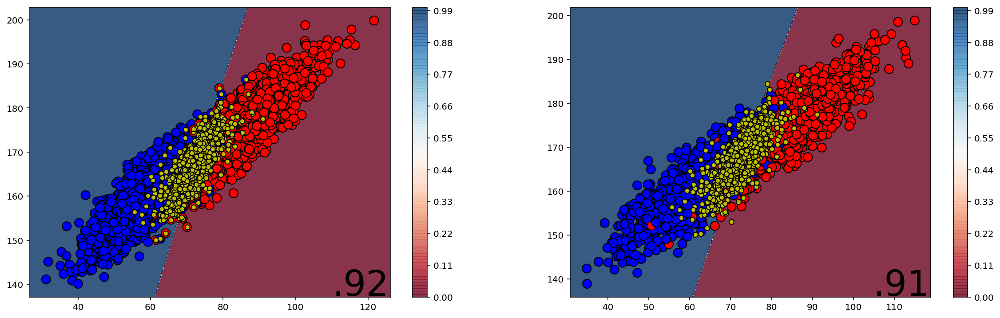

C = 10^-13
La cantidad de vectores de soporte es 1064


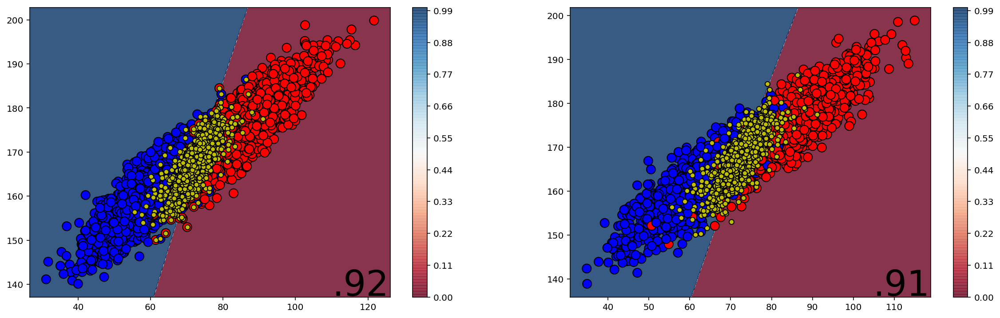

C = 10^-12
La cantidad de vectores de soporte es 1061


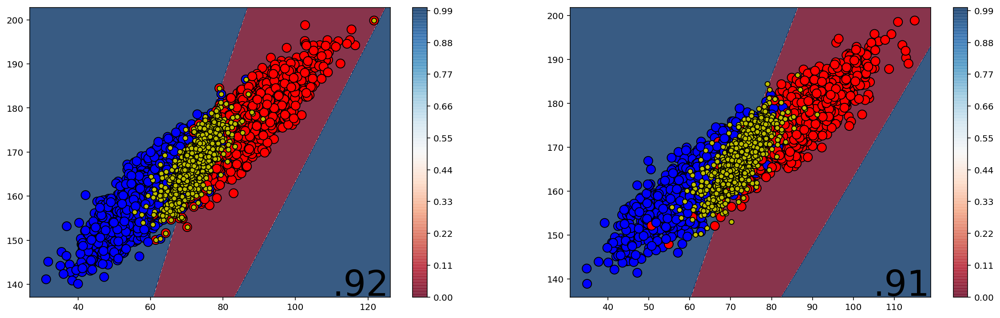

C = 10^-11
La cantidad de vectores de soporte es 970


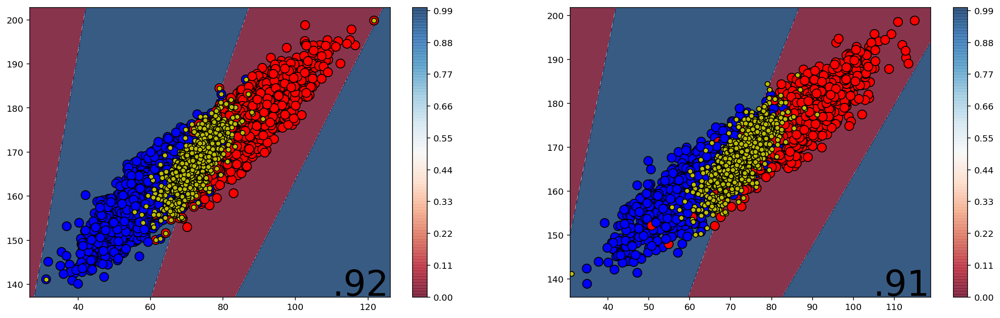

C = 10^-10
La cantidad de vectores de soporte es 808


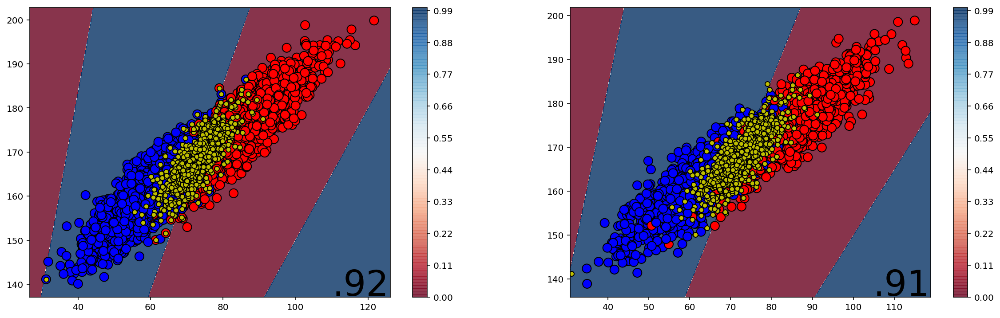

C = 10^-9
La cantidad de vectores de soporte es 767


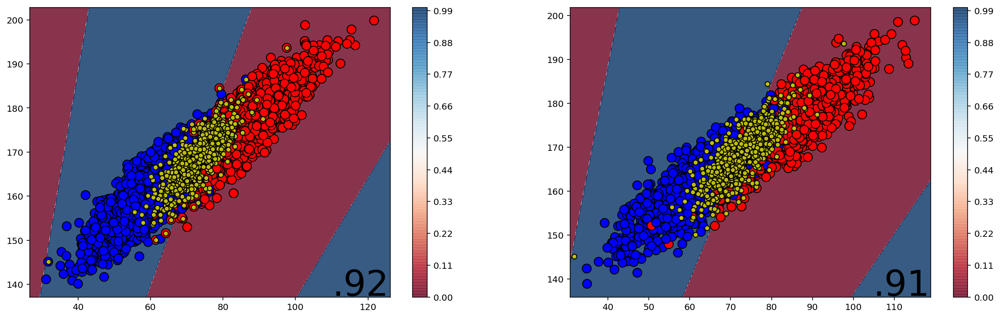

C = 10^-8
La cantidad de vectores de soporte es 761


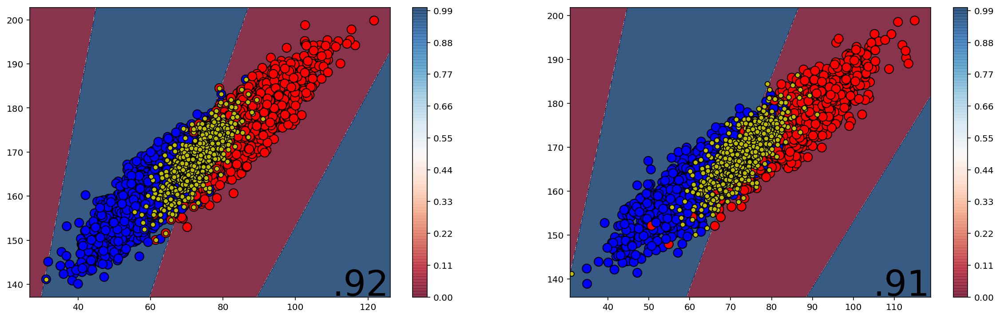

C = 10^-7
La cantidad de vectores de soporte es 761


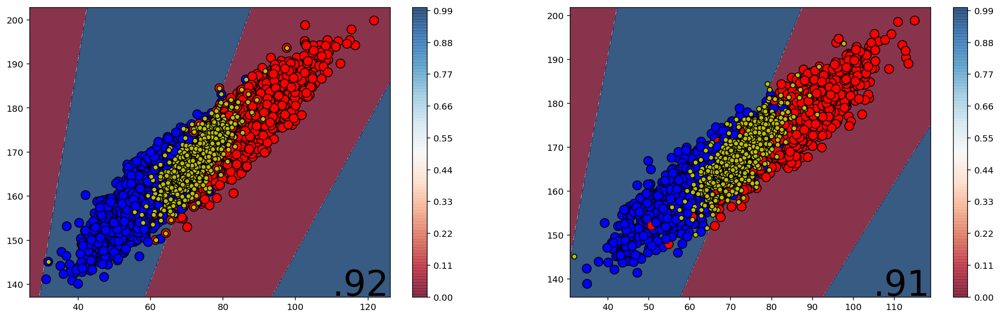

In [58]:
for mod_n,C in enumerate(range(-14,-6)):
    print("C = 10^{}".format(C))
    model3=SVC(kernel='poly',degree=4,C=10**C,tol=1e-6)
    model3.fit(X2_train,y2_train)
    score_train=model3.score(X2_train,y2_train)
    score_test=model3.score(X2_test,y2_test)
    print("La cantidad de vectores de soporte es {}".format(model3.support_vectors_.shape[0]))
    def pred_class(X_test):
        out=list()
        a= model3.decision_function(X_test)
        out= [[i<0,i>=0] for i in a]
        return np.array(out)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,6))
    RHelper.plot_boundaries_SVM(X2_train,y2_train, score_train,support_vectors=model3.support_vectors_,class_func=pred_class, ax=ax1)
    RHelper.plot_boundaries_SVM(X2_test,y2_test, score_test,support_vectors=model3.support_vectors_,class_func=pred_class, ax=ax2)
    plt.show()

C = 10^4
score: 0.6949152542372882
(48, 2)


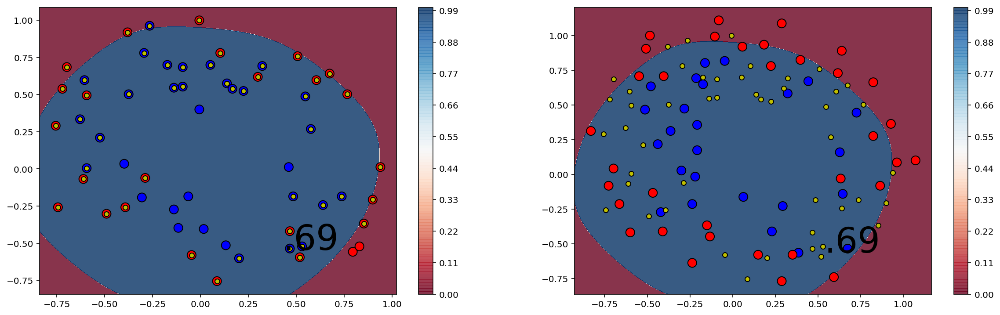

C = 10^5
score: 0.7457627118644068
(39, 2)


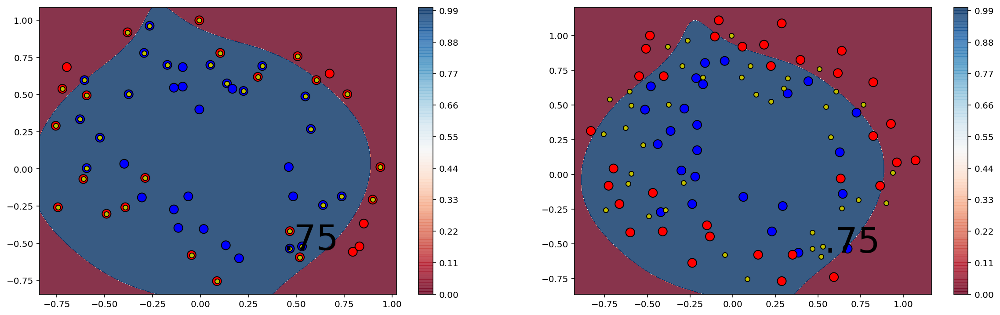

C = 10^6
score: 0.7796610169491526
(32, 2)


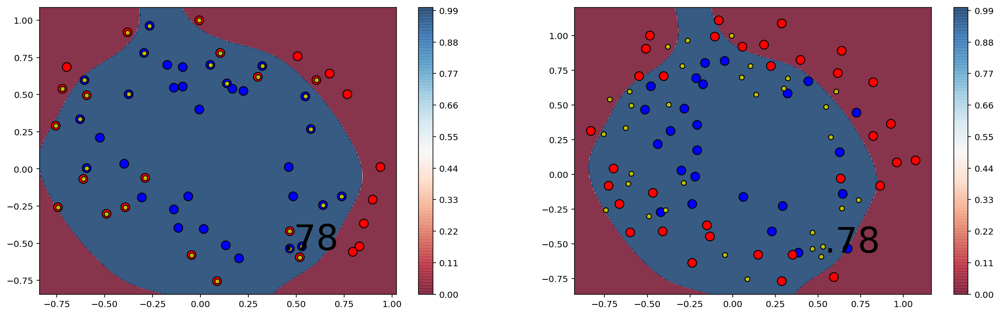

C = 10^7
score: 0.8305084745762712
(31, 2)


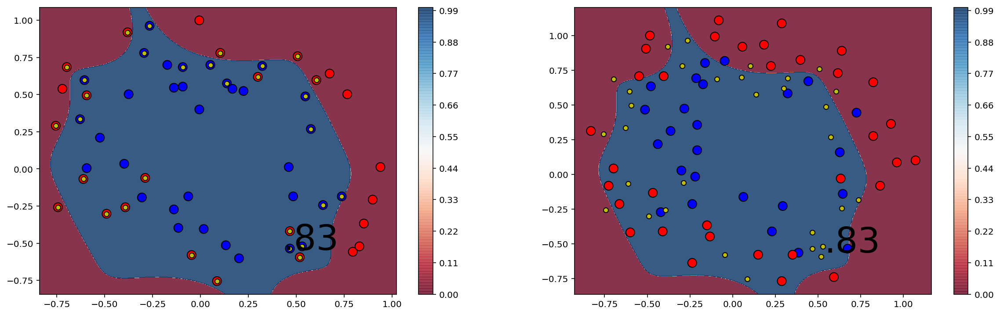

C = 10^8
score: 0.8305084745762712
(30, 2)


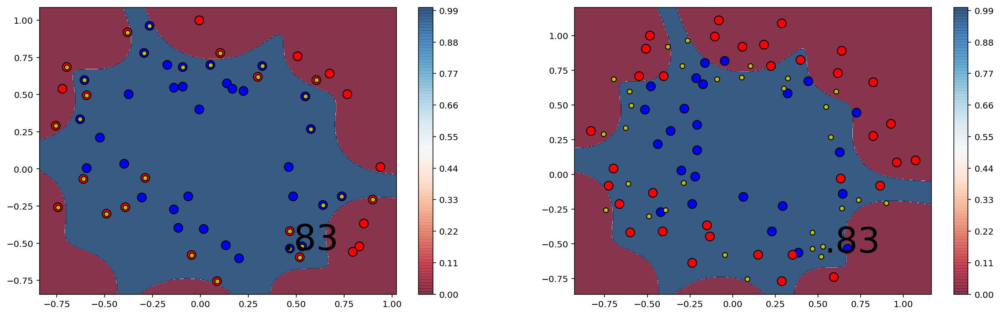

In [33]:
for mod_n,C in enumerate(range(4,9)):
    print("C = 10^{}".format(C))
    model4=SVC(kernel='poly',degree=12,C=10**C,tol=1e-3) #El tiempo de entrenamiento aumenta mucho a medida que aumento el grado del polinomio
    model4.fit(X_train,y_train)
    score=model4.score(X_train,y_train)
    print("score: {}".format(score))
    print(model4.support_vectors_.shape)
    def pred_class(X_test):
        out=list()
        a= model4.decision_function(X_test)
        out= [[i<0,i>=0] for i in a]
        return np.array(out)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,6))
    RHelper.plot_boundaries_SVM(X_train, y_train, score,support_vectors=model4.support_vectors_,class_func=pred_class, ax=ax1)
    RHelper.plot_boundaries_SVM(X_test, y_test, score,support_vectors=model4.support_vectors_,class_func=pred_class, ax=ax2)
    plt.show()

### Radial Basis Functions (RBF)



C = 10^0
La cantidad de vectores de soporte es 2476


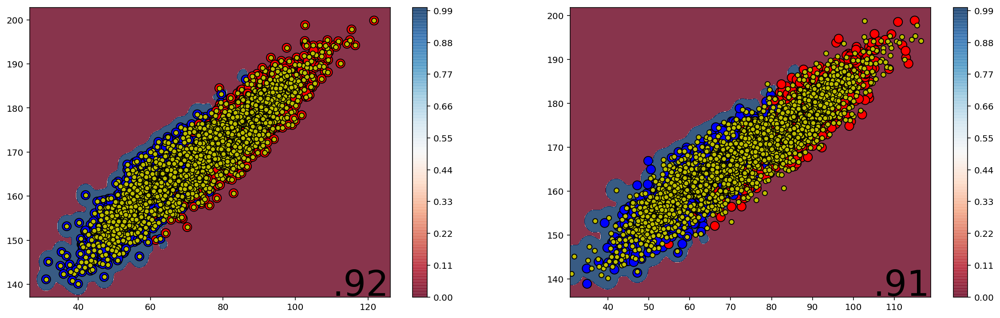

C = 10^1
La cantidad de vectores de soporte es 1835


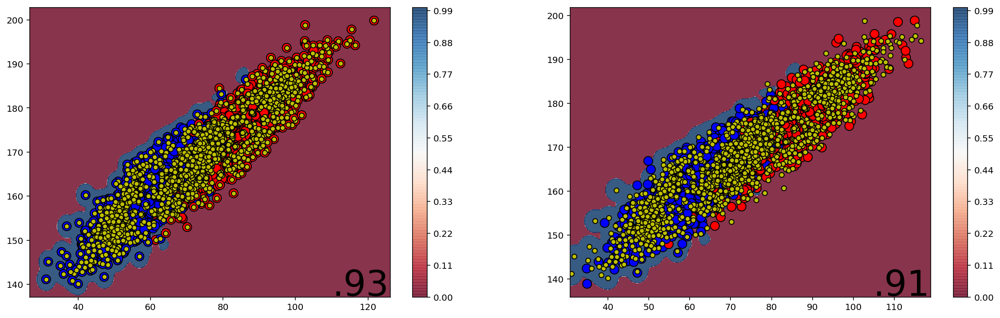

In [59]:
for mod_n,C in enumerate(range(0,2)):
    print("C = 10^{}".format(C))
    model5=SVC(kernel='rbf',C=10**C,tol=1e-3)
    model5.fit(X2_train,y2_train)
    score_train=model5.score(X2_train,y2_train)
    score_test=model5.score(X2_test,y2_test)
    print("La cantidad de vectores de soporte es {}".format(model5.support_vectors_.shape[0]))
    def pred_class(X_test):
        out=list()
        a= model5.decision_function(X_test)
        out= [[i<0,i>=0] for i in a]
        return np.array(out)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,6))
    RHelper.plot_boundaries_SVM(X2_train,y2_train, score_train,support_vectors=model5.support_vectors_,class_func=pred_class, ax=ax1)
    RHelper.plot_boundaries_SVM(X2_test,y2_test, score_test,support_vectors=model5.support_vectors_,class_func=pred_class, ax=ax2)
    plt.show()

C = 10^0


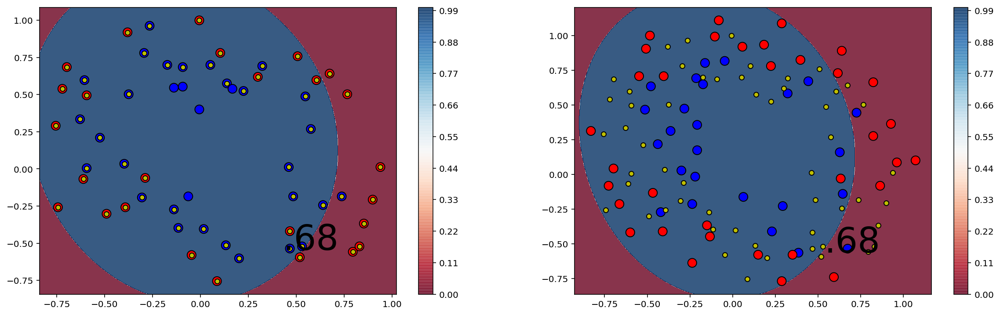

C = 10^1


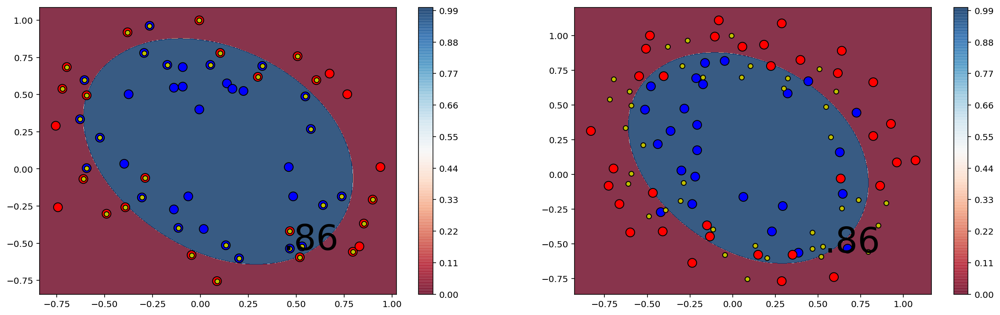

C = 10^2


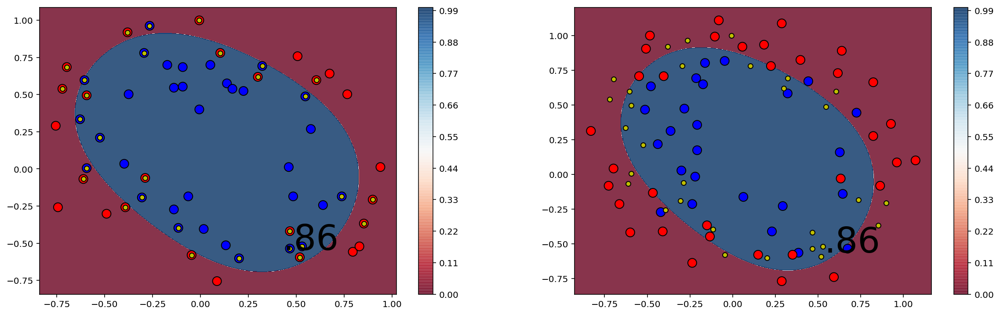

C = 10^3


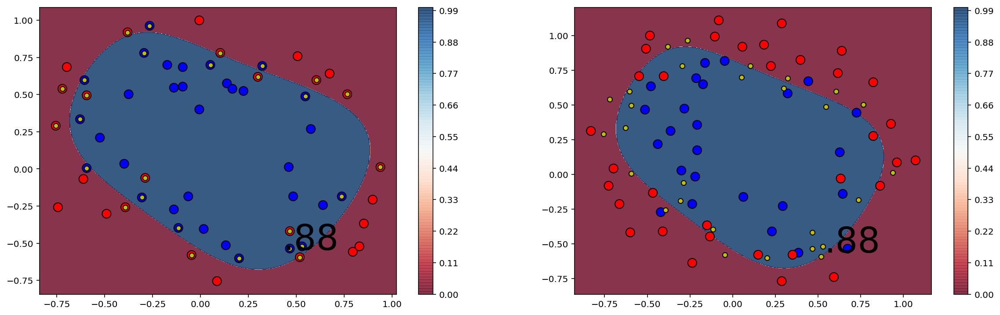

C = 10^4


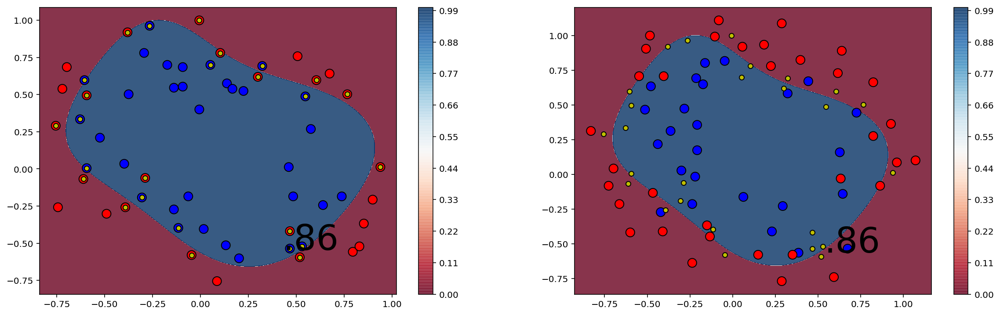

C = 10^5


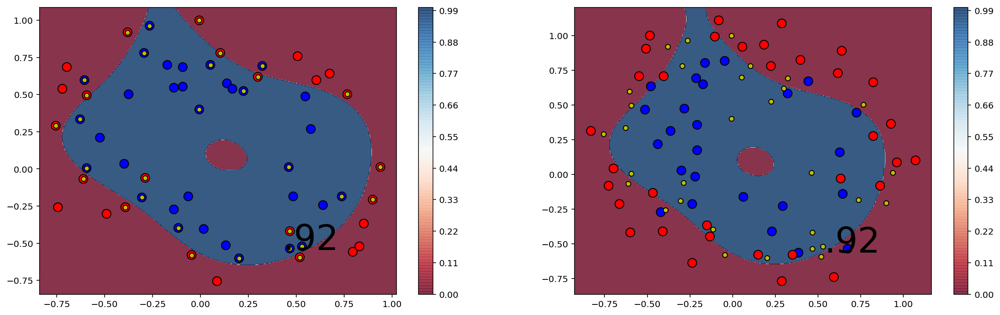

In [60]:
for mod_n,C in enumerate(range(0,6)):
    print("C = 10^{}".format(C))
    model6=SVC(kernel='rbf',C=10**C,tol=1e-3) #El tiempo de entrenamiento aumenta mucho a medida que aumento el grado del polinomio
    model6.fit(X_train,y_train)
    score=model6.score(X_train,y_train)
    #print("score: {}".format(score))
    #print(model6.support_vectors_.shape)
    def pred_class(X_test):
        out=list()
        a= model6.decision_function(X_test)
        out= [[i<0,i>=0] for i in a]
        return np.array(out)
    f, (ax1,ax2) = plt.subplots(1, 2, figsize=(20,6))
    RHelper.plot_boundaries_SVM(X_train, y_train, score,support_vectors=model6.support_vectors_,class_func=pred_class, ax=ax1)
    RHelper.plot_boundaries_SVM(X_test, y_test, score,support_vectors=model6.support_vectors_,class_func=pred_class, ax=ax2)
    plt.show()

# Clasificación multiclase

En el caso de las máquinas de vectores de soporte, para clasificación multiclase se utilizan los siguientes esquemas:

## One vs Rest:

Se arma un clasificador binario para cada clase, donde se compara a la clase con otra clase definida por el resto. Para este caso no se utiliza la salida binaria, sino que se usa la pseudo-probabilidad que da cada clasificador para su clase. Para clasificar se asigna la clase con pseudo-probabilidad mas alta:

In pseudocode, the training algorithm for an OvA learner constructed from a binary classification learner L is as follows:

Inputs:
- $L$, a learner (training algorithm for binary classifiers)
- samples $X$
- labels $y$ where $y_i ∈ {1, … K}$ is the label for the sample $X_i$

Output:
- a list of classifiers $f_k$ for $k ∈ {1, …, K}$

Procedure:

- For each $k$ in ${1, …, K}$

Construct a new label vector $z$ where $z_i = 1$ if $y_i = k$ and $z_i = 0$ otherwise.

Apply $L$ to $X$, $z$ to obtain $f_k$  
Making decisions means applying all classifiers to an unseen sample $x$ and predicting the label $k$ for which the corresponding classifier reports the highest confidence score:

$ {\displaystyle {\hat {y}}={\underset {k\in \{1\ldots K\}}{\arg \!\max }}\;f_{k}(x)}$

Although this strategy is popular, it is a heuristic that suffers from several problems. Firstly, the scale of the confidence values may differ between the binary classifiers. Second, even if the class distribution is balanced in the training set, the binary classification learners see unbalanced distributions because typically the set of negatives they see is much larger than the set of positives.

Problemas:

- Los clasificadores pueden quedar con escalas de confidencia distintas
- Por mas que el dataset esté balanceado, los clasificadores binarios ven datasets desbalanceados. 

## One vs One

In the one-vs.-one (OvO) reduction, one trains K (K − 1) / 2 binary classifiers for a K-way multiclass problem; each receives the samples of a pair of classes from the original training set, and must learn to distinguish these two classes. At prediction time, a voting scheme is applied: all K (K − 1) / 2 classifiers are applied to an unseen sample and the class that got the highest number of "+1" predictions gets predicted by the combined classifier.[




### The iris dataset

This data sets consists of 3 different types of irises’ (Setosa, Versicolour, and Virginica) petal and sepal length, stored in a 150x4 numpy.ndarray
The rows being the samples and the columns being: Sepal Length, Sepal Width, Petal Length and Petal Width.
The below plot uses the first two features. See here for more information on this dataset.

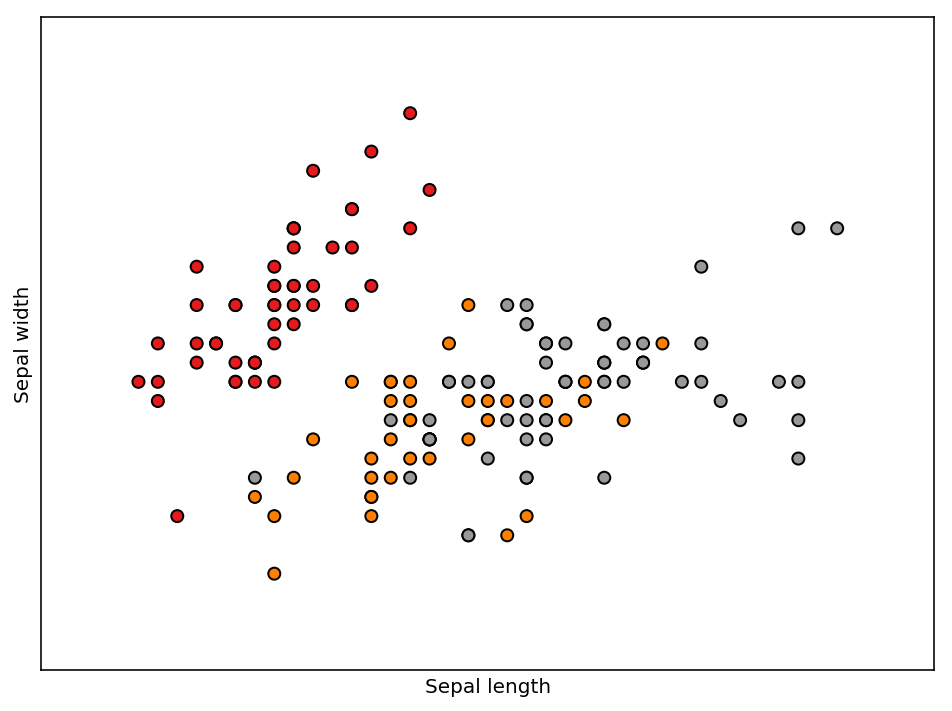

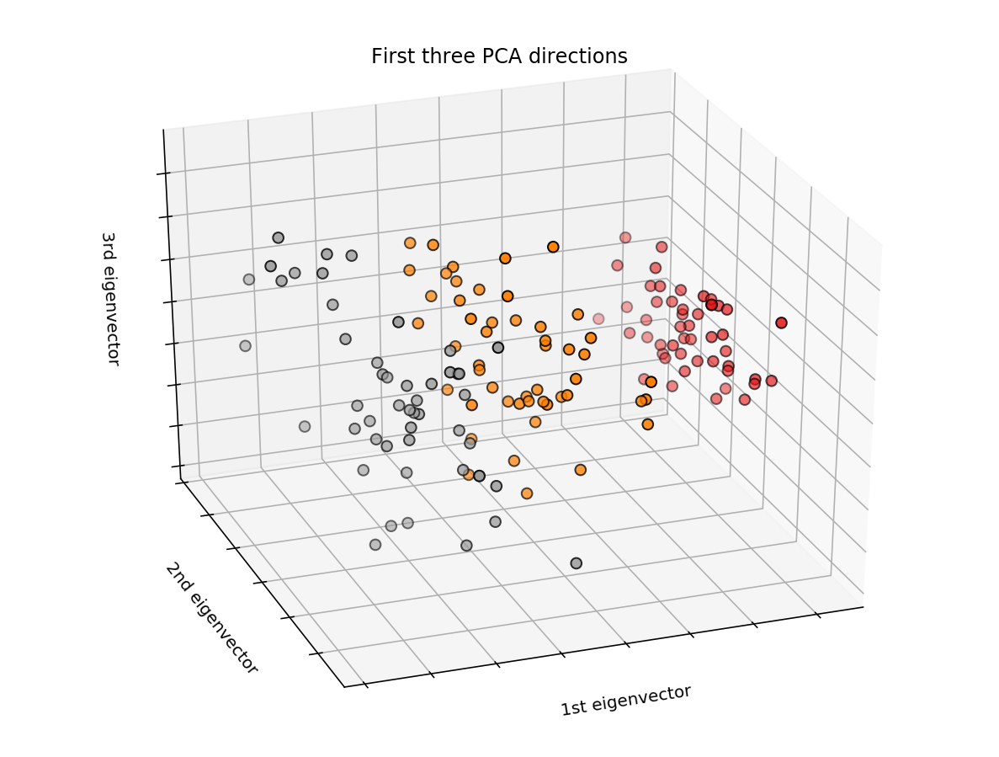

In [61]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn import datasets
from sklearn.decomposition import PCA

# import some data to play with
iris = datasets.load_iris()
X = iris.data[:, :2]  # we only take the first two features.
y = iris.target

x_min, x_max = X[:, 0].min() - .5, X[:, 0].max() + .5
y_min, y_max = X[:, 1].min() - .5, X[:, 1].max() + .5

plt.figure(2, figsize=(8, 6))
plt.clf()

# Plot the training points
plt.scatter(X[:, 0], X[:, 1], c=y, cmap=plt.cm.Set1,
            edgecolor='k')
plt.xlabel('Sepal length')
plt.ylabel('Sepal width')

plt.xlim(x_min, x_max)
plt.ylim(y_min, y_max)
plt.xticks(())
plt.yticks(())

# To getter a better understanding of interaction of the dimensions
# plot the first three PCA dimensions
fig = plt.figure(1, figsize=(8, 6))
ax = Axes3D(fig, elev=-150, azim=110)
X_reduced = PCA(n_components=3).fit_transform(iris.data)
ax.scatter(X_reduced[:, 0], X_reduced[:, 1], X_reduced[:, 2], c=y,
           cmap=plt.cm.Set1, edgecolor='k', s=40)
ax.set_title("First three PCA directions")
ax.set_xlabel("1st eigenvector")
ax.w_xaxis.set_ticklabels([])
ax.set_ylabel("2nd eigenvector")
ax.w_yaxis.set_ticklabels([])
ax.set_zlabel("3rd eigenvector")
ax.w_zaxis.set_ticklabels([])

plt.show()

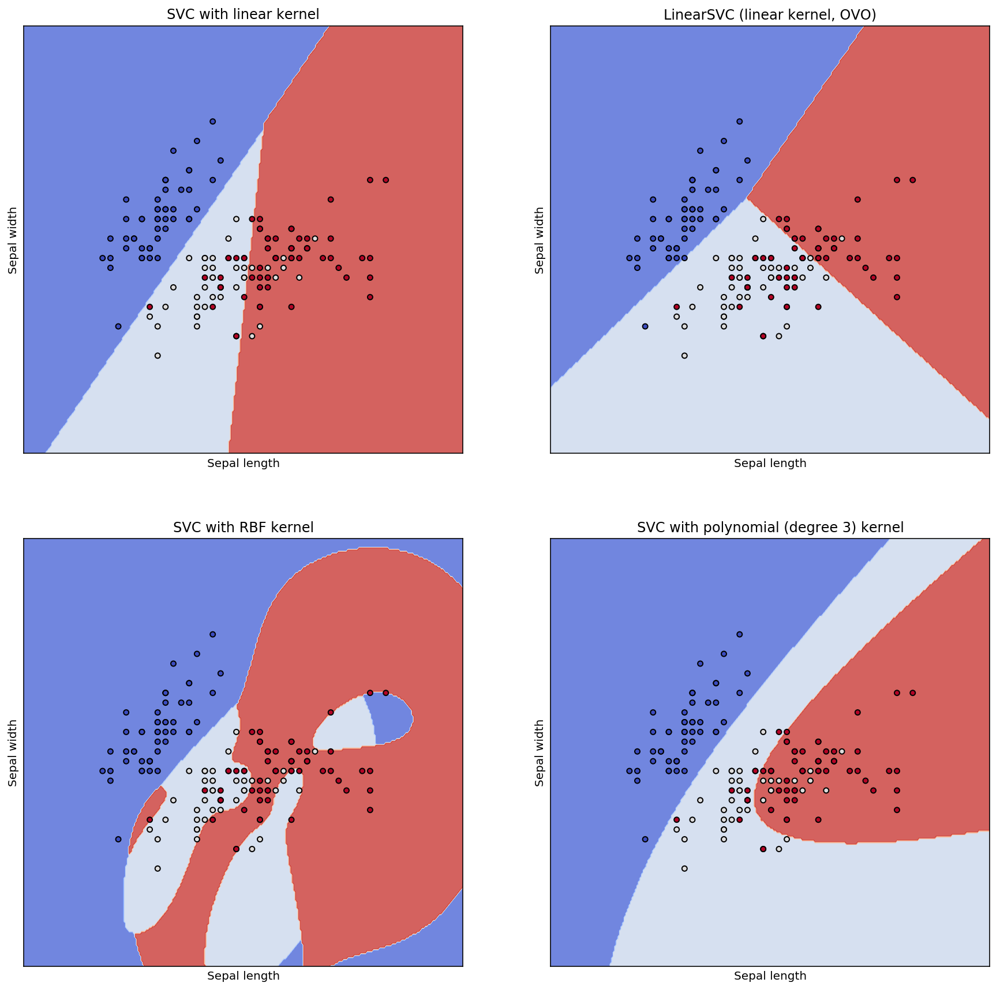

In [71]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn import svm, datasets


def make_meshgrid(x, y, h=.02):
    """Create a mesh of points to plot in

    Parameters
    ----------
    x: data to base x-axis meshgrid on
    y: data to base y-axis meshgrid on
    h: stepsize for meshgrid, optional

    Returns
    -------
    xx, yy : ndarray
    """
    x_min, x_max = x.min() - 1, x.max() + 1
    y_min, y_max = y.min() - 1, y.max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                         np.arange(y_min, y_max, h))
    return xx, yy


def plot_contours(ax, clf, xx, yy, **params):
    """Plot the decision boundaries for a classifier.

    Parameters
    ----------
    ax: matplotlib axes object
    clf: a classifier
    xx: meshgrid ndarray
    yy: meshgrid ndarray
    params: dictionary of params to pass to contourf, optional
    """
    Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    out = ax.contourf(xx, yy, Z, **params)
    return out


# import some data to play with
iris = datasets.load_iris()
# Take the first two features. We could avoid this by using a two-dim dataset
X = iris.data[:, :2]
y = iris.target

# we create an instance of SVM and fit out data. We do not scale our
# data since we want to plot the support vectors
C = 1000000  # SVM regularization parameter
models = (svm.SVC(kernel='linear', C=C),
          svm.LinearSVC(C=C),
          svm.SVC(kernel='rbf', gamma=0.7, C=C),
          svm.SVC(kernel='poly', degree=3, C=C))
models = (clf.fit(X, y) for clf in models)

# title for the plots
titles = ('SVC with linear kernel',
          'LinearSVC (linear kernel, OVO)',
          'SVC with RBF kernel',
          'SVC with polynomial (degree 3) kernel')

# Set-up 2x2 grid for plotting.
fig, sub = plt.subplots(2, 2,figsize=(15,15))
#plt.subplots_adjust(wspace=0.4, hspace=0.4)

X0, X1 = X[:, 0], X[:, 1]
xx, yy = make_meshgrid(X0, X1)

for clf, title, ax in zip(models, titles, sub.flatten()):
    plot_contours(ax, clf, xx, yy,
                  cmap=plt.cm.coolwarm, alpha=0.8)
    ax.scatter(X0, X1, c=y, cmap=plt.cm.coolwarm, s=20, edgecolors='k')
    ax.set_xlim(xx.min(), xx.max())
    ax.set_ylim(yy.min(), yy.max())
    ax.set_xlabel('Sepal length')
    ax.set_ylabel('Sepal width')
    ax.set_xticks(())
    ax.set_yticks(())
    ax.set_title(title)

plt.show()